# CS-171 Final Project - Classifying Butterfly Images
## By: Edward Yan

# Step 0: Import the Necessary Packages
This project uses many Python packages to train the model, display its results, and make your life while trying to run it easier. The packages are in two groups: non-PyTorch packages and PyTorch packages.

In [1]:
# import packages
import os
import time
import pickle
import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from sklearn.model_selection import train_test_split

In [2]:
# pytorch packages
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset

# Step 1: Data Preparation
Now that we have imported the packages, we can prepare the data for the machine learning model. The dataset this project uses is from this Kaggle link: https://www.kaggle.com/datasets/phucthaiv02/butterfly-image-classification. \
\
Downloading the full dataset provides you 2 folders, labeled **train** and **test**, and their accompanying .csv files. For this project, the only 2 items you will need are the **train** folder and **Training_set.csv**. Please place these 2 in the same directory as this notebook. 

Taking a look into the **train** folder shows you the butterfly images which this model trains on. You should also see that the images have generic names and are not sorted into labeled folders. The images' labels are in the **Training_set.csv** file, so we have to load them into a Pandas dataframe. This is done in the cell below, which also gets all the unique species names. 

In [3]:
# read in labels and get the species
df = pd.read_csv('Training_set.csv')
species = sorted(df['label'].unique())
#species

The above cell gets the names of all the included butterfly species because machine learning models cannot work with non-numerical labels. As such, we have to assign each species an integer ID label and add it to the dataframe so we can use them later.

In [4]:
# map each species to an id
species_id = {species: idx for idx, species in enumerate(species)}
#species_id
df['id'] = df['label'].map(species_id)
#df

And finally, to load the butterfly images through the dataframe, we have to include the image filepath. Because all the images are kept in a folder called **train** which is in the same directory as the notebook, we can just prepend 'train' to every filename and put the result in a new column. The complete dataframe we will use is below.

In [5]:
# add filenames to the df
df['filepath'] = df['filename'].apply(lambda x: os.path.join("train", x))
df

,filename,label,id,filepath
0,Image_1.jpg,SOUTHERN DOGFACE,66,train/Image_1.jpg
1,Image_2.jpg,ADONIS,0,train/Image_2.jpg
2,Image_3.jpg,BROWN SIPROETA,12,train/Image_3.jpg
3,Image_4.jpg,MONARCH,44,train/Image_4.jpg
4,Image_5.jpg,GREEN CELLED CATTLEHEART,33,train/Image_5.jpg
...,...,...,...,...
6494,Image_6495.jpg,MANGROVE SKIPPER,40,train/Image_6495.jpg
6495,Image_6496.jpg,MOURNING CLOAK,45,train/Image_6496.jpg
6496,Image_6497.jpg,APPOLLO,4,train/Image_6497.jpg
6497,Image_6498.jpg,ELBOWED PIERROT,29,train/Image_6498.jpg


Now the dataframe is prepared, we can split it and, by proxy, the **train** folder for our train/test split. We have to do this because the **test** folder is just like **train**, in that it is just a folder of unlabeled images, and while **Training_set.csv** contains the label corresponding to each image, **Testing_set.csv** does not. Thus, we cannot assign the images in **test** their labels. **train** contains 6499 images, though, which is more than enough for our purposes. \
\
This project will use a 70/15/15 split for train/test/validation. The stratify field ensures that each split will have an equal amount of each species. Because the images are all of a uniform size, this is all the data preparation we need to perform.

In [6]:
# split into train, 70%
train_df, temp_df = train_test_split(
    df, 
    test_size=0.30, 
    stratify=df['id'], 
    random_state=42
)

# split into test/val, 15% each
val_df, test_df = train_test_split(
    temp_df,
    test_size=0.50, 
    stratify=temp_df['id'], 
    random_state=42
)

# Step 2: Creating Datasets and Loaders

First, we have to define our own custom Dataset class. It tells PyTorch how to get our images. We have to define a custom Dataset class because PyTorch can't read our dataframe on its own, and PyTorch has to because our image labels are in the dataframe.

In [7]:
# create dataset class
class ButterflyDataset(Dataset):
    def __init__(self, df, transform=None):
        self.paths = df['filepath'].values
        self.labels = df['id'].values
        self.transform = transform

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):
        img = Image.open(self.paths[idx]).convert("RGB")
        label = int(self.labels[idx])

        if self.transform:
            img = self.transform(img)

        return img, label

With that done, we next define the trainformations we want to apply to our images when the model loads them. We want these transformations for our training images to prevent the model from overfitting on the training data, as they muddy up the details and force the model to be better at identifying key features. However, we do not want these transformations for the testing data, as these images have to be representative of the real butterfly. After all, the purpose of this model is to tell real butterfly species apart, not some rotated or oversaturated image of them.\
\
The training transformations include random chances for horizontal flips, small rotations, and slight alterations to the colors of the image.

In [8]:
# transform for training data
train_transform = transforms.Compose([

    # apply random flips and rotations
    transforms.RandomHorizontalFlip(p=0.3),
    # random vertical flip may make the butterfly look unnatural, may re-add with reduced chance
    #transforms.RandomVerticalFlip(p=0.3),
    transforms.RandomRotation(degrees=15),

    # apply random color jitters or perspectives
    transforms.RandomApply([
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
        transforms.RandomPerspective(distortion_scale=0.4, p=0.3)
    ], p=0.3),

    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

# transform for testing data
test_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

Here we create the datasets and dataloaders. We apply the transformations we defined in the dataset, and then we pass it through the dataloader. We want shuffle to be on for the training dataloader as we want the model to see the images in a different order every epoch, but we want it off for the testing dataloader as it introduces unnecessary randomness.

In [9]:
# create datasets and dataloaders
BATCH_SIZE = 32

train_dataset = ButterflyDataset(train_df, train_transform)
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)

test_dataset = ButterflyDataset(test_df, test_transform)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

# Step 3: Construct a CNN

For this project, we will implement a Convolutional Neural Network (CNN). This CNN is relatively simple, as it only has 3 layers with outputs 16 to 32 to 64. Additionally, it uses AdaptiveAvgPool2d, which dynamically calculates the output size of the output layers. These two choices, the smaller layer outputs and AdaptiveAvgPool2d, were attempts to make the model faster. I didn't know the speed of this CNN when I implemented it, but from the past CNNs we ran in class and for homework, I knew it would be slow, and those CNNs were running on a fraction of the images I would be. As such, I had to consciously limit the number of features the CNN would generate. Finally, this CNN has a 30% dropout layer as another measure against overfitting.

In [10]:
# implement the CNN
class ClassificationCNN(nn.Module):
    def __init__(self, num_classes):
        super(ClassificationCNN, self).__init__()

        self.conv_layers = nn.Sequential(
            nn.Conv2d(3, 16, 3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),
            nn.Conv2d(16, 32, 3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),
            nn.Conv2d(32, 64, 3, padding=1),
            nn.ReLU(),
            nn.AdaptiveAvgPool2d((1,1))
        )
        
        self.fc_layers = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64, 128),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(128, num_classes)
        )

    # define the forward step
    def forward(self, x):
        x = self.conv_layers(x)
        x = self.fc_layers(x)
        return x

The loss function for this CNN is Cross Entropy Loss.

In [11]:
# loss function
criterion = nn.CrossEntropyLoss()

# Step 4: Define Training Methods

This code block chooses the backend the model will run on based on your device. Using the right backend for your device will maximize the efficiency of the model training.

In [12]:
if torch.backends.mps.is_available():
    device = torch.device("mps")
elif torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")
print("Using device:", device)

Using device: mps


This function computes the number of images which the model correctly predicted the label for as well as the number of total predictions it made. 

In [13]:
def compute_correct_labels(outputs, labels):
    correct = 0
    total = 0
    _, predicted_values = torch.max(outputs, 1)
    differences = predicted_values - labels
    for i in range(len(differences)):
        if differences[i]==0:
            correct +=1
        total += 1
    return(correct, total)

This is the training loop. It's comprised of two parts: the training loop and the testing loop. In the training loop, the model runs through the testing image set and records its loss and accuracy for each epoch. The model learns during this loop. In the testing loop, the same things happen but the model doesn't learn as we switch it to eval mode. 

In [14]:
def training_loop(model, optimizer, NUM_EPOCHS, train_loader, test_loader, printing=True):
    # make empty lists to keep track of the training and testing losses
    train_losses = []
    test_losses = []
    train_accuracies = []
    test_accuracies = []
    
    # loop through each epoch to run the training loop
    # and check the model with the training data
    # keep track of both sets of losses as your go
    for epoch in range(NUM_EPOCHS):
        
        # Run the training loop
        model.train()
        total_train_loss = 0.0
        total_train_correct = 0
        total_train_images = 0
        for train_inputs, train_labels in train_loader:
            train_inputs, train_labels = train_inputs.to(device), train_labels.to(device)
            optimizer.zero_grad()
            outputs = model(train_inputs)
            train_correct, train_total = compute_correct_labels(outputs, train_labels)
            total_train_correct += train_correct
            total_train_images += train_total
            loss = criterion(outputs, train_labels)
            loss.backward()
            optimizer.step()
            total_train_loss += loss.item()
        avg_train_loss = total_train_loss / len(train_loader)
        train_losses.append(avg_train_loss)
        train_accuracies.append(total_train_correct/total_train_images)

        # Run the testing loop
        # this is essentially the same as the training loop but
        # without the optimizer and backward propagation
        model.eval()
        total_test_loss = 0.0
        total_test_correct = 0
        total_test_images = 0
        with torch.no_grad():
            for test_inputs, test_labels in test_loader:
                test_inputs, test_labels = test_inputs.to(device), test_labels.to(device)
                outputs = model(test_inputs)
                test_correct, test_total = compute_correct_labels(outputs, test_labels)
                total_test_correct += test_correct
                total_test_images += test_total
                loss = criterion(outputs, test_labels)
                total_test_loss += loss.item()
        avg_test_loss = total_test_loss / len(test_loader)
        test_losses.append(avg_test_loss)
        test_accuracies.append(total_test_correct/total_test_images)
        if printing:
            print(f"Epoch {epoch+1}/{NUM_EPOCHS}"+\
                  f" - Train Loss: {avg_train_loss:.4f}, "+\
                  f"Train Correct: {total_train_correct}/{total_train_images} "+\
                  f"- Test Loss: {avg_test_loss:.4f}, "+\
                  f"Test Correct: {total_test_correct}/{total_test_images} ")

    return(train_losses, test_losses, train_accuracies, test_accuracies)

# Step 5: Training the Model

Before you can train the CNN or load in a pre-trained model, you have to set some hyperparameters. \
\
First is the number of epochs. This will determine how many times the training loop will run and how much the model will train. For the current implementation, each epoch takes 0.4 minutes, or 24 seconds. Do note that this value will not matter if you choose to load in the pre-trained model.\
\
Second is whether or not you want to load in the pre-trained model. Included with the download of this notebook were two files: **training_history.pkl** and **checkpoint.pth**. If these two files are kept in the same directory as this notebook, they will be loaded in instead of the model running its training loop. Set this to false if you want to train your own model. \
\
Third is whether or not you want to save your model. If set to true, after your model finishes training, it will create two files in the directory: **user_training_history.pkl** and **user_checkpoint.pth**. The former stores the model losses and accuracy, which are used for graphing in future steps, and the latter is the actual model. \
\
Fourth is whether or not you want to print the losses and number of correct predictions of every epoch. This will create a lot of clutter if enabled.

In [36]:
# select some hyperparameters
NUM_EPOCHS = 1
LOAD_PRETRAINED = True
SAVE_MODEL = False
PRINTING = False

Run this cell to either train your own model or load the pre-trained model. The bottom of the cell will inform you of the current progress and if the system has accomplished its assignment.

In [37]:
# get the number of classes
num_classes = len(df['label'].unique())

# create model and optimizer
model = ClassificationCNN(num_classes).to(device)
optimizer = optim.Adam(model.parameters(), lr=0.0001)

# if the user is choosing to run the pre-trained model
if os.path.exists("checkpoint.pth") and os.path.exists("training_history.pkl") and LOAD_PRETRAINED:

    # set NUM_EPOCHS to the correct amount to for this pre-trained model
    NUM_EPOCHS = 1000
    
    # load the losses and accuracy
    with open("training_history.pkl", "rb") as f:
        history = pickle.load(f)

    # give the training_loop return variables value
    train_losses = history["train_losses"]
    test_losses = history["test_losses"]
    train_accuracy = history["train_accuracy"]
    test_accuracy = history["test_accuracy"]

    # load the model
    checkpoint = torch.load("checkpoint.pth", weights_only=False)
    model.load_state_dict(checkpoint['model_state'])
    optimizer.load_state_dict(checkpoint['optimizer_state'])

    # inform the user
    print("The pre-trained model and its loss and accuracy have been loaded.")

# if the user is choosing to train their own model
else:
    print("Training has begun.")

    # training begins
    start = time.time()

    # training loop
    train_losses, test_losses, train_accuracy, test_accuracy = training_loop(
        model, optimizer, NUM_EPOCHS, train_loader, test_loader, printing=PRINTING
    )
                                                                        
    # training ends
    end = time.time()

    print('Training has ended.')
    print(f'Training Time: {(end - start)/60:.2f} minutes')

    if (SAVE_MODEL):
        #save the user's losses and accuracy
        history = {
            "train_losses": train_losses,
            "test_losses": test_losses,
            "train_accuracy": train_accuracy,
            "test_accuracy": test_accuracy
        }
        with open("user_training_history.pkl", "wb") as f:
            pickle.dump(history, f)
    
        # save the model
        torch.save({
            'model_state': model.state_dict(),
            'optimizer_state': optimizer.state_dict(),
        }, 'user_checkpoint.pth')

        # inform the user
        print('Your model and its loss and accuracy have been saved.')

The pre-trained model and its loss and accuracy have been loaded.


# Step 6: Test and Training Losses

Running this cell plots the testing and training losses of the current model. The default shows the losses of the pre-trained model. I will provide commentary on the losses of the pre-trained model in a future section. 

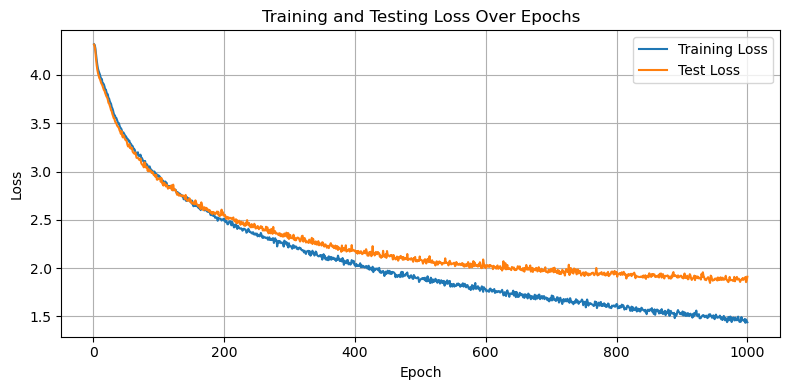

In [29]:
plt.figure(figsize=(8, 4))
plt.plot(range(1, NUM_EPOCHS + 1), train_losses, '-', label='Training Loss')
plt.plot(range(1, NUM_EPOCHS + 1), test_losses, '-', label='Test Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Testing Loss Over Epochs')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Step 7: Test and Training Accuracy

Running this cell plots the testing and training accuracy of the current model. The default shows the accuracy of the pre-trained model. I will provide commentary on the accuracy of the pre-trained model in a future section. 

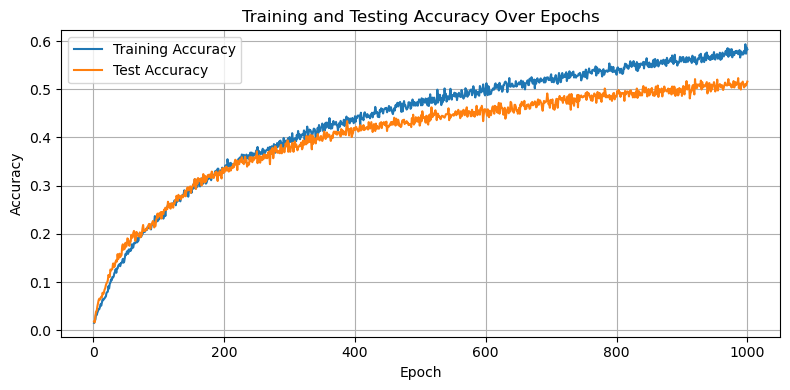

In [30]:
plt.figure(figsize=(8, 4))
plt.plot(range(1, NUM_EPOCHS + 1), train_accuracy, '-', label='Training Accuracy')
plt.plot(range(1, NUM_EPOCHS + 1), test_accuracy, '-', label='Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Testing Accuracy Over Epochs')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Step 8: Evaluating the Model

Running this cell chooses 1 image for each of the 75 butterfly species and has the current model predict what species the butterfly in the image is. These images and predictions, along with the actual label, are plotted on a 5 by 25 grid to allow for easy viewing. Running this cell again will choose a different set of 75 pictures to test the model on.

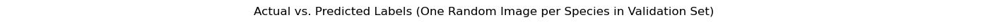

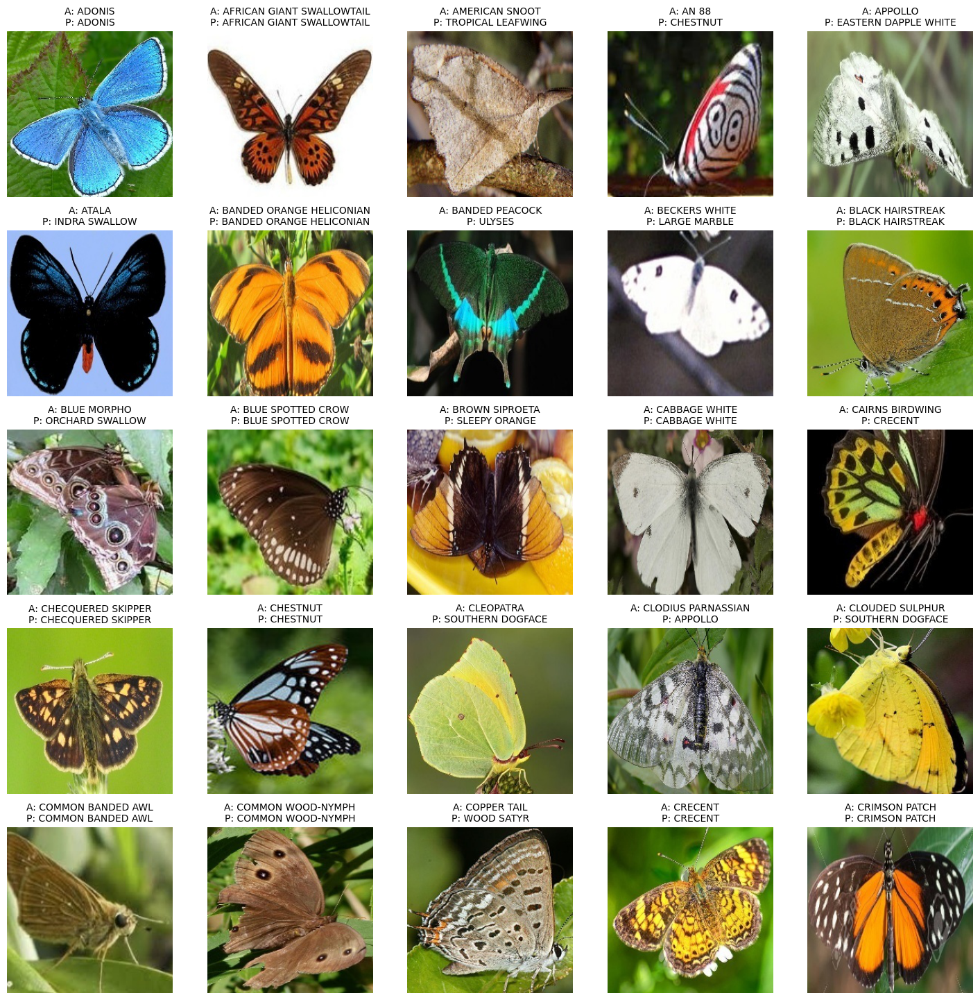

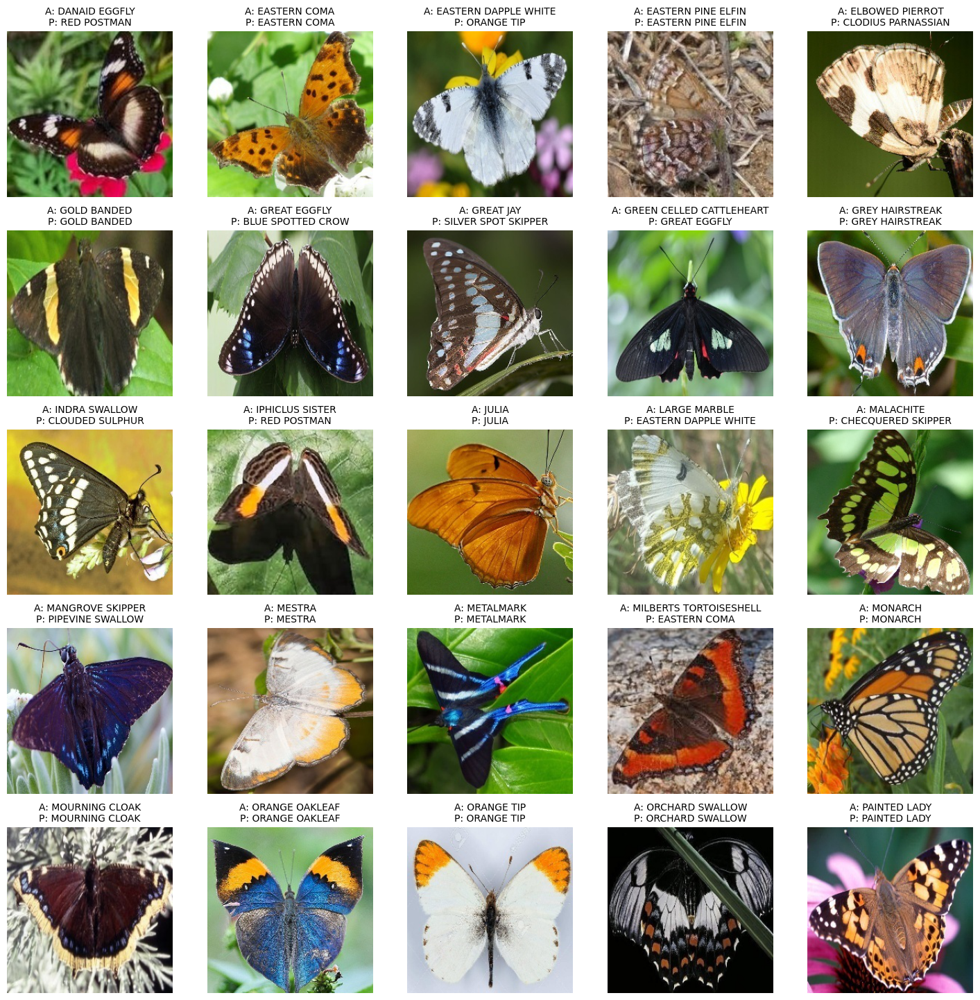

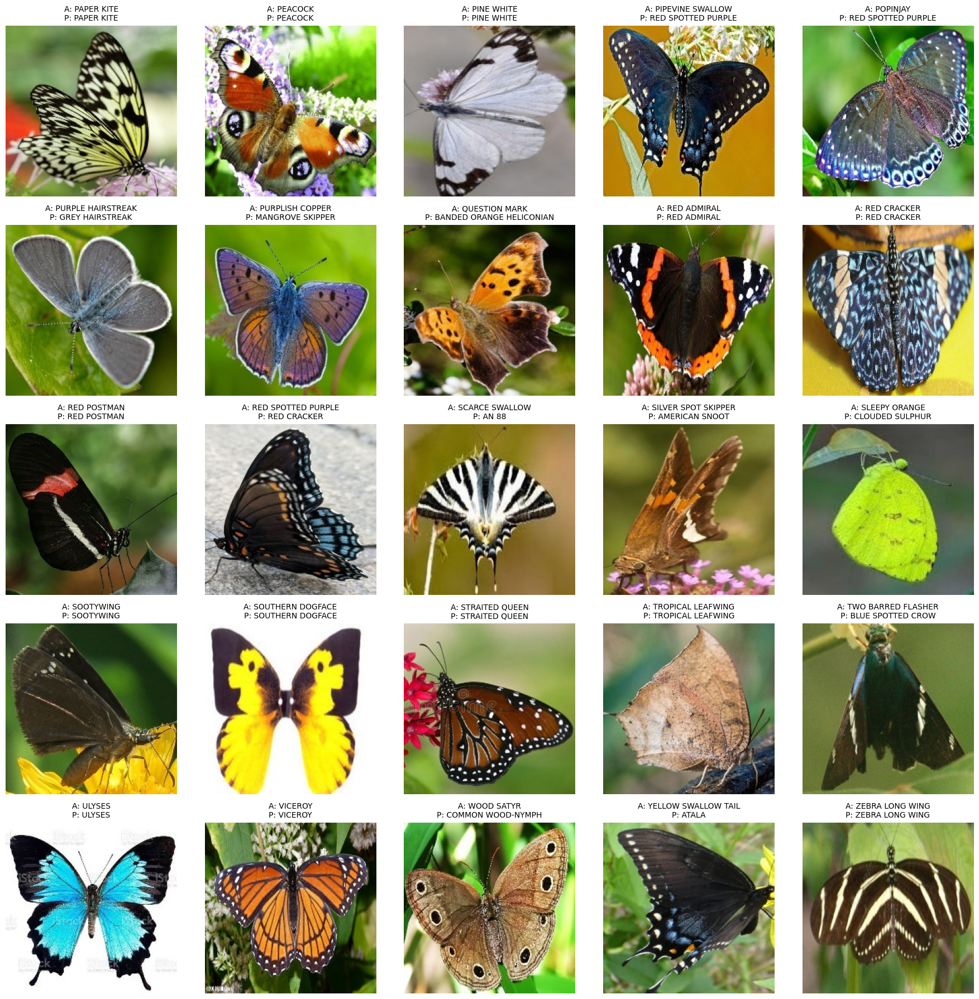

In [20]:
model.eval()

# map each species id to the species label
id_species = {i:s for s, i in species_id.items()}

# group them into 3 groups of 25 for better plotting
groups = [species[0:25], species[25:50], species[50:75]]

# dummy plot to hold the title
plt.figure(figsize=(18, 0.1))
plt.suptitle('Actual vs. Predicted Labels (One Random Image per Species in Validation Set)')
plt.axis('off')
plt.show()

for j, group in enumerate(groups):

    fig = plt.figure(figsize=(18, 18))
    gs = gridspec.GridSpec(5, 5)

    for i, sp in enumerate(group):

        # pick a random image for this species
        row_data = val_df[val_df['label'] == sp].sample(1).iloc[0]
        image_path = row_data['filepath']
        actual_label = row_data['label']

        # load and transform
        image = Image.open(image_path).convert('RGB')
        input_tensor = test_transform(image).unsqueeze(0).to(device)

        # predict
        with torch.no_grad():
            output = model(input_tensor)
            _, pred_idx = torch.max(output, 1)
            predicted_label = id_species[pred_idx.item()]

        # plot
        ax = fig.add_subplot(gs[i // 5, i % 5])
        ax.imshow(image)
        ax.axis("off")
        ax.set_title(f"A: {actual_label}\nP: {predicted_label}", fontsize=10)

plt.tight_layout()
plt.show()

# Step 9: Analysis and Comparison

The central question my partner Anton and I posed was **whether CNNs would struggle more with classifying different butterfly species or different species of animals**. Anton's project focused on seeing how well a CNN could classify different animals, and his model found great success with relatively few epochs. There were differences between our models; for example, his model had 5 convolutional layers compared to my 3, but these differences were minor compared to the staggering differences in how many epochs we ran and the success we achieved. \
\
If I remember correctly, Anton ran his CNN for 50 epochs and achieved about 70% testing accuracy. Compare this to the 1000 epochs I ran and the 50% testing accuracy I achieved and you will see an immediate and staggering difference in efficiency and reliability. Given we had similar models, most of this difference in performance must come from datasets, and this makes sense. How a computer sees and how we humans see are not one-to-one, but it's not a stretch to say that **animals with very distinct and different profiles are easier to tell apart from each other compared to butterflies**, which can share very similar shapes and colors. This was our initial hypothesis, and the data backs it up quite nicely. 

To speak a little on my own model, please refer to the graphs from steps 7 and 8. As you can see, after 1000 epochs, my modeled ended with a testing accuracy of around 50% and a testing loss of 2. It is still nowhere near converging, and it is even showing signs of being overfit, as the training accuracy is about 10% higher than the testing accuracy at 60%, and the training loss is about 0.5 lower at 1.5. Still, 50% accuracy is a lot better than the 1.33% chance of randomly guessing 1 of the 75 butterfly species, and you can see this using the evaluator from step 8. The model gets a lot of the butterflies right. Definitely way more than I could.

The evaluator also shows some of the quirks of the images in the dataset. If you run it over and over again to see the different butterfly images and how the model does on them, you will inevitably find one image that has a watermark. How likely this is to affect training I am unsure of, but it something to bear in mind. Also, while most of the images are of butterflies in the wild, on flowers and surrounded by greenery, some are images of dead butterflies on display. These post-mortem images almost all have a white backdrop, putting the butterfly's colors on much clearer display, though somewhat unifying the shape. The shape of the butterflies is also varied, and it's not just the shape of their wings. Many of the images are of side profiles, which don't show the full wing span of the butterfly.

Overall, making this CNN has made me think a little bit about how good the computer vision systems and image classification models of actual biologists and environmental scientists are. Machines can monitor areas and track butterfly populations for much longer than a human, and they may even be good enough to record data without human intervention. Butterflies are an important part of the ecosystem, serving as pollinators, and many species are facing drastic population collapses due to human activities. They are also pretty, and I don't want them to die out. 